# End-to-End Multi class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying a breed of dog given an image of a dog.

## 2. Data

The data we are using is from Kaggle dog breed identification competition.

## 3. Evaluation

Multi-class log loss is the loss function and the output or test includes prediction probabilities of a dog belonging to a all the classes.

## 4. Features

Some information about the data:
* we are deadling with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (1.e. 120 different classes)
* There are are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ image sin the testv set (these images have no labels, because we'll want to predict them)


### Getting our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow Hub ✅
* Make sure we are using a GPU ✅

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("Tensorflow version: ", tf.__version__)
print("Hub version: ", hub.__version__)

print("GPU", "available (YASSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

Tensorflow version:  2.17.1
Hub version:  0.16.1
GPU available (YASSSS!!!!!)


### Getting our Data Ready (turning into tensors)

Tensors are numerical represnetation of an image and since all machine learning models require data to be in numerical format, we will also convert our images into numerical formats aka tensors

In [ ]:
import pandas as pd
label_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [ ]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
label_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

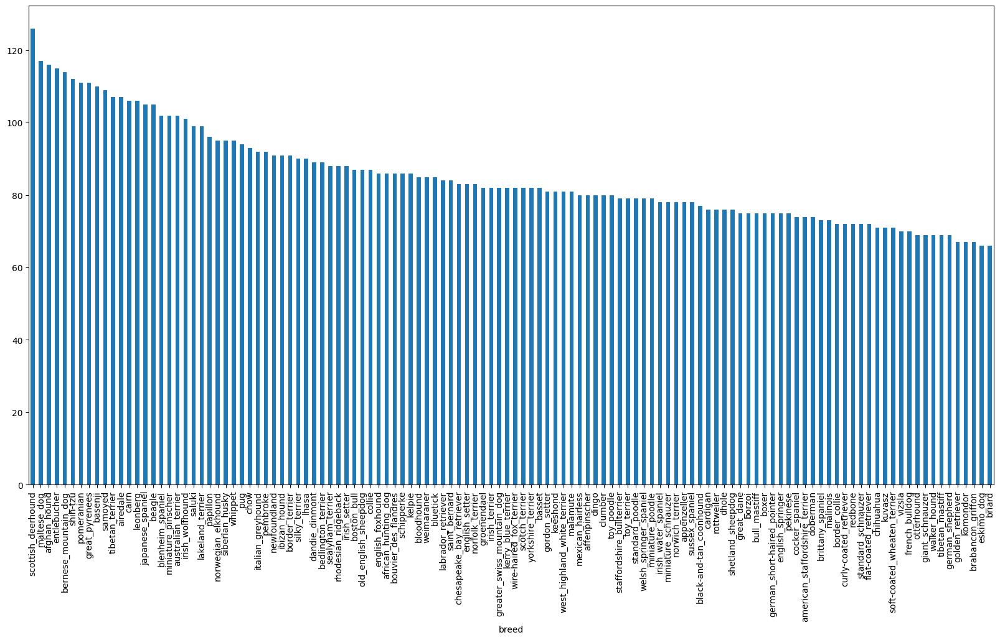

In [ ]:
label_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
label_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
label_csv["breed"].value_counts().median()

82.0

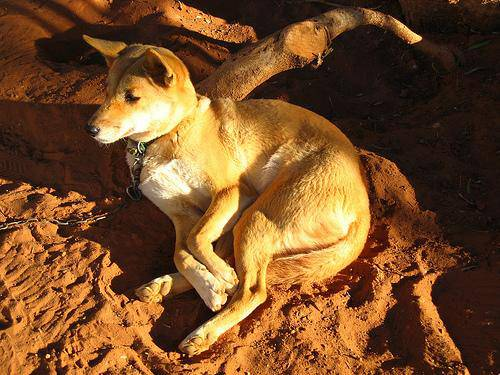

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their labels

In [ ]:
label_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
filenames = [f"drive/MyDrive/Dog Vision/train/{id}.jpg" for id in label_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

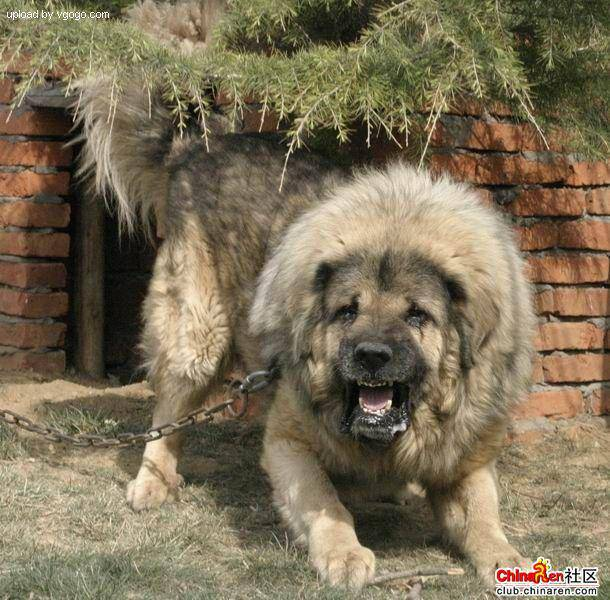

In [ ]:
Image(filenames[9000])

In [ ]:
label_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match the actual amount of files!!! Proceed.")
else:
  print("Filenames do not match the actual amount of files, check the target directory")

Filenames match the actual amount of files!!! Proceed.


Since now we have got our training image filepaths, we will now prepare our labels

In [ ]:
import numpy as np
labels = label_csv["breed"].to_numpy()

In [ ]:
len(labels)

10222

In [ ]:
if len(filenames) == len(labels):
  print("No of labels match no of filenames!")
else:
  print("No of labels do not match the number of filenames, check the directory.")

No of labels match no of filenames!


In [ ]:
unique_lables = np.unique(labels)
len(unique_lables)

120

In [ ]:
# Now we will convert these labels into booleans and then into 1 hot incodings

boolean_labels = [label == unique_lables for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Creating our own validation set

In [ ]:
X = filenames
y = boolean_labels

len(X), len(y)

(10222, 10222)

We are going to experiemnt with ~1000 samples and increase as we need.

In [ ]:
NUM_IMAGES = 1000 #@param {type: 'slider', min: 1000, max: 10222, step: 100}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42
)

len(X_train), len(y_train), len(X_val),len(y_val)

(800, 800, 200, 200)

### Preprocess Image (Turning Images to Tensors)

Here we are going to write a function that performs the following:

1. Takes an image filepath as input
2. Use TensorFlow to read the file and save it in a variable `image`
3. Turn our `image` (jpg) into a tensor
4. Normalize our image (convert color channel values from 0-255to 0-1)
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
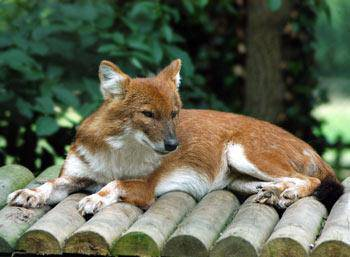

In [ ]:
image

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

def process_image(img_path):
  """
  1. Takes an image filepath as input
  2. Use TensorFlow to read the file and save it in a variable image
  3. Turn our image (jpg) into a tensor
  4. Normalize our image (convert color channel values from 0-255to 0-1)
  5. Resize the image to be a shape of (224, 224)
  6. Return the modified image
  """

  image = tf.io.read_file(img_path) # read a file and return its contents as a tensor string
  image = tf.image.decode_jpeg(image, channels=3) # convert string representation of jpg image to a tensor
  image = tf.image.convert_image_dtype(image, tf.float32) # Normalization
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image


### Turning our data into batches

Using entire data for pattern finding in 10,000+ images will be very bad for the memory and performance. An ideal batch size is 32.

In order to use our TensorFlow effectively, we meed our data in the form of a Tensorflow tuple which looks like `(image, label)`

In [ ]:
def get_image_label(img_path, label):
  """
  Takes as input a image path and the label associated
  returns the processed image and the label as a tuple
  """
  return process_image(img_path), label

In [ ]:
get_image_label(X_train[12], y_train[12])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.02610951, 0.05840446, 0.02610951],
         [0.01564032, 0.05287803, 0.02045193],
         [0.0991832 , 0.13745351, 0.10278964],
         ...,
         [0.18335326, 0.23825522, 0.17943169],
         [0.06609178, 0.08563023, 0.09900574],
         [0.3515049 , 0.3632696 , 0.39327657]],
 
        [[0.1285647 , 0.17548871, 0.1285647 ],
         [0.12984718, 0.176906  , 0.13769032],
         [0.08939721, 0.1274225 , 0.09296341],
         ...,
         [0.02042856, 0.04680085, 0.0200732 ],
         [0.13195314, 0.16551185, 0.14740728],
         [0.44108993, 0.46470687, 0.4564698 ]],
 
        [[0.02043653, 0.06369345, 0.02043653],
         [0.17211291, 0.21917175, 0.17995605],
         [0.1251286 , 0.15648934, 0.12759997],
         ...,
         [0.01235115, 0.06552564, 0.00864551],
         [0.39038607, 0.43109858, 0.37183735],
         [0.31331438, 0.34737426, 0.28811303]],
 
        ...,
 
        [[0.8580978 , 0.79927427

In [ ]:
# Define a batch size, 32 is a good start
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data only if it is training data.
  Also accepts test data as input (no labels)
  """

  if test_data:
    print("creating testing data batches...")
    # create tensorflow dataset of X filepaths, process them and return as per batchsize
    data = tf.data.Dataset.from_tensor_slices(
        (tf.constant(X))
    )  # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  elif valid_data:
    print("creating validation data batches...")
    # create tensorflow dataset of X filepaths & y labels, get (processed_image, label) tuple them and return as per batchsize
    data = tf.data.Dataset.from_tensor_slices(
        (tf.constant(X), tf.constant(y))
    )  # Filepaths     , Labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices(
        (tf.constant(X), tf.constant(y))
    )

    # shuffle pathnames and labels before preprocessing because it is faster when comparied to doing it after processing
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch


In [ ]:
training_data = create_data_batches(X_train, y_train)
validation_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches...
creating validation data batches...


In [ ]:
training_data.element_spec, validation_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualzie Data batches

In [ ]:
import matplotlib.pyplot as plt

def show_batch_images(images, labels, n = 25):
  """
  Displays a plot of n images and their labels from a data batch.
  """
  plt.figure(figsize= (10, 10))

  for i in range(n):
    ax = plt.subplot(5, 5, i+1)

    plt.imshow(images[i])
    plt.title(unique_lables[labels[i].argmax()])
    plt.axis("off")

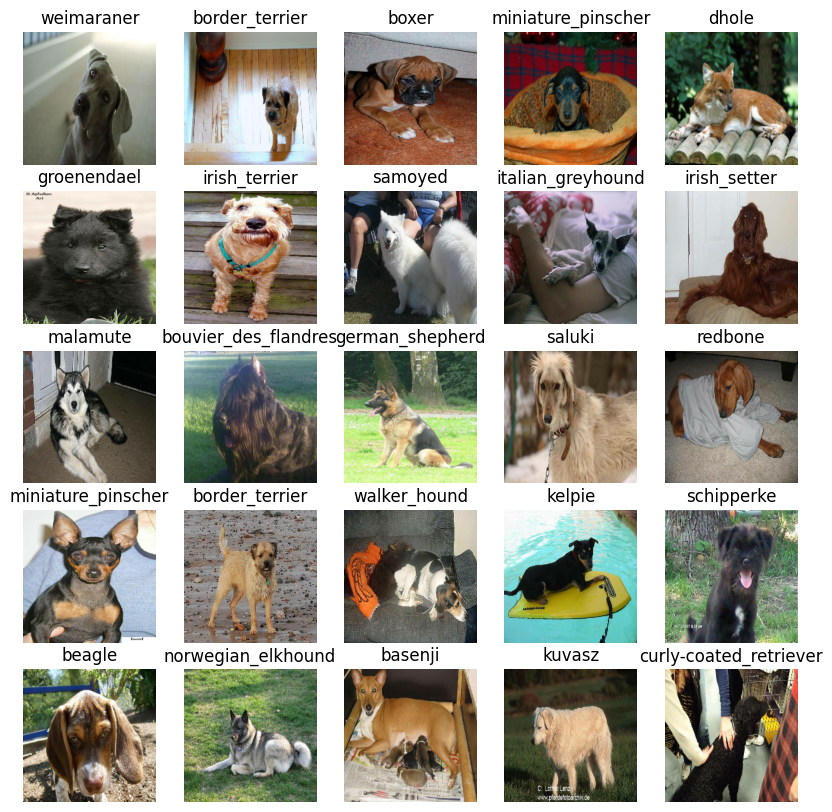

In [ ]:
training_images, training_labels = next(training_data.as_numpy_iterator())
show_batch_images(training_images, training_labels)

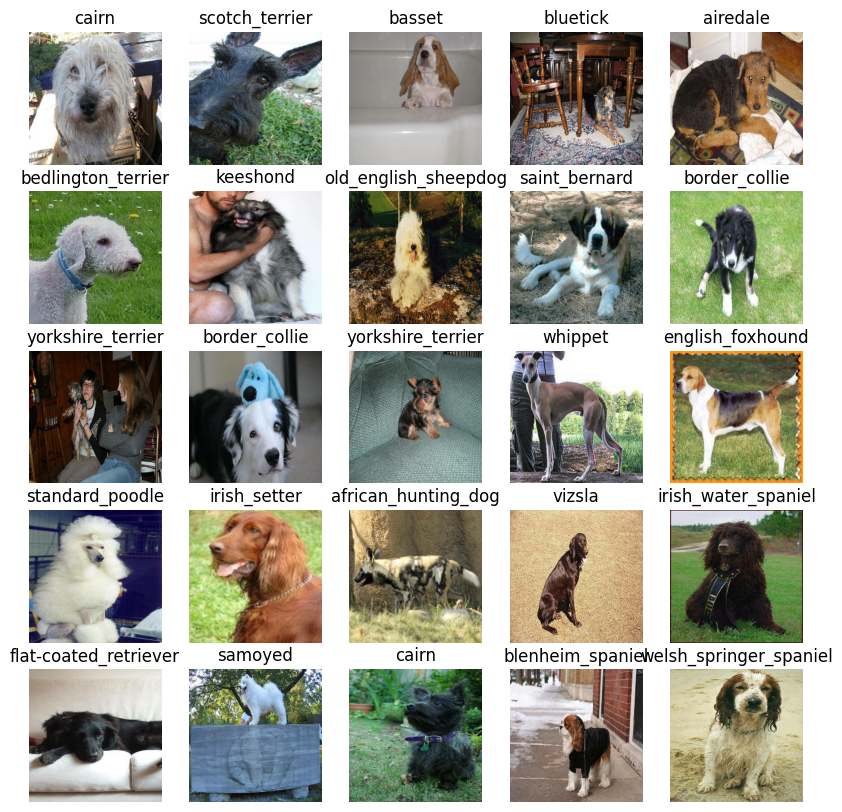

In [ ]:
validation_images, validation_labels = next(validation_data.as_numpy_iterator())
show_batch_images(validation_images, validation_labels)

### Building a Model

Before building a model, there are a few things we must define:

1. The input shape((our Image Shape, in the form of tensor) to our model.
2. The output shape (image labels, in the form of tensors) of our model.
3. The url of the model we want to use from tensorflow HUB (Kaggle models: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification).

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_lables)

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we will create a function which:

1. Takes the input shape, output shape and choosen model as parameters
2. Define the layers in keras model in sequential fashion.
3. Complies the model (says on what it should be evaluated and improved)
4. Builds the models (tells the model, the input shape it will be getting)
5. Return the model

In [ ]:
# create a function which builds a keras model
import tf_keras

def create_model(input_shape=INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building a model with", model_url)

  # setup model layers
  model = tf_keras.Sequential([
      hub.KerasLayer(model_url), # layer 1
      tf_keras.layers.Dense( # layer 2
          units = output_shape,
          activation = "softmax"
      )
  ])

  # compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building a model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating Callbacks

Callbacks are helper functions a model can use during training to do such things such as save its progress, check its progress or stop training early if a model stops improving.

We'll be creating two callbacks, one for TensorBoard (which helps us track our model's progress) and another to stop model's training if it is going on for too long.



#### TensorBoard

To setup a TensorBoard callback, we need to do 3 things:

1. Load the tensorboard notebook extension
2. Create a dicteory where we can store the logs related to how our model's training is going on.
3. Pass that log file path to the model's fit function
4. Visualize our model's training logs with the tensorboard mangic fucntion

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  log_dir = os.path.join(
      "drive/My Drive/Dog Vision/logs",
      datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  )
  return tf_keras.callbacks.TensorBoard(log_dir)

#### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric shape stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# As soon as our models accuracy stops improving after 3 epochs this callback will stop the training
early_stopping = tf_keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=3
)

### Training a model (on subset of data)

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, setp:10}

In [ ]:
print("GPU", "Available!!" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available!!


Training a model here will require the following steps:

1. create a model using `create_model()`
2. setup the tensorboard callback using the `create_tensorboard_callback()`
3. call the `fit()` function on our model passing the training data, validation data, no of epcochs to train for and the callbacks we'd like to use.
4. Return the model

In [ ]:
def train_model():
  # Create a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(
      x=training_data,
      epochs=NUM_EPOCHS,
      validation_data=validation_data,
      validation_freq=1,
      callbacks=[tensorboard, early_stopping]
  )

  # return the model
  return model

In [ ]:
model = train_model()

Building a model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 231s 9s/step - loss: 4.7121 - accuracy: 0.0850 - val_loss: 3.4743 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 4s 178ms/step - loss: 1.7302 - accuracy: 0.6687 - val_loss: 2.1875 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 3s 135ms/step - loss: 0.6196 - accuracy: 0.9237 - val_loss: 1.7542 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 159ms/step - loss: 0.2733 - accuracy: 0.9800 - val_loss: 1.5553 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 5s 211ms/step - loss: 0.1572 - accuracy: 0.9975 - val_loss: 1.4578 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 145ms/step - loss: 0.1052 - accuracy: 1.0000 - val_loss: 1.4133 - val_accuracy: 0.6200
Epoch 7/100
25/25 [===============

Here the training accuracy is way higher to that of validation accuracy. This means that our model might be overfitting the data (which on the bright side tells that our model is atleast learning)

### Checking the TensorBoard Logs

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
validation_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(validation_data, verbose=1)
predictions

7/7 [==============================] - 1s 113ms/step


array([[1.1581946e-03, 8.8883362e-06, 7.7123009e-04, ..., 2.2767640e-03,
        3.3607568e-05, 4.4996864e-03],
       [1.3670425e-03, 1.0405481e-03, 4.5050949e-02, ..., 2.5553248e-04,
        1.8602489e-03, 5.2865391e-05],
       [5.3599466e-05, 3.8350496e-04, 5.0331414e-04, ..., 3.2949541e-03,
        1.8547723e-04, 6.1150838e-04],
       ...,
       [7.0190194e-06, 1.1498524e-05, 9.1780867e-06, ..., 6.2502381e-06,
        4.9576181e-04, 6.4045962e-05],
       [2.9489219e-03, 4.4190505e-04, 2.7169590e-04, ..., 1.2777296e-04,
        5.5706078e-05, 1.5519571e-02],
       [1.4794850e-03, 3.0455578e-04, 1.1184280e-03, ..., 1.0662993e-02,
        2.3969039e-04, 1.2665329e-04]], dtype=float32)

In [ ]:
index = 42
print(predictions[index])
print("Max value: (probability)", np.max(predictions[index]))
print("sum:", np.sum(predictions[index]))
print("Max Index:", np.argmax(predictions[index]))
print("Predicted Breed:", unique_lables[np.argmax(predictions[index])])

[1.81275129e-04 4.47948587e-05 1.94223194e-05 2.94326564e-05
 2.78781314e-04 6.59913712e-06 2.43886843e-05 3.76221666e-04
 1.02891354e-02 7.41781667e-03 8.36393428e-06 9.53950439e-06
 6.35513512e-04 2.95252330e-03 1.95972432e-04 2.50280066e-03
 3.28419969e-06 2.25495998e-04 2.20465627e-05 1.63203717e-04
 1.74772285e-05 5.94953832e-04 1.10996834e-05 3.45202193e-06
 2.27338937e-03 5.15980646e-05 5.92864944e-06 1.18683973e-04
 8.59162319e-05 1.98061825e-05 1.61578610e-05 1.72481323e-05
 2.57790998e-05 1.89738494e-05 2.90864637e-06 1.49809921e-05
 1.48016668e-04 1.33775349e-04 6.92913227e-06 3.72866422e-01
 7.13629779e-05 3.28676606e-06 3.86140728e-03 1.46587433e-06
 3.53301497e-04 4.88198857e-05 4.13023954e-05 2.79498228e-04
 8.82043605e-06 1.29279098e-04 8.60896180e-05 7.86781020e-05
 4.77480389e-05 4.03345271e-04 1.22427582e-06 1.06618594e-04
 2.08945949e-05 4.72789725e-05 3.52737079e-05 4.84327347e-06
 5.19885216e-05 2.04838259e-04 3.90528703e-06 1.54904810e-05
 6.04870474e-05 2.158196

#### Turn prediction probabilities in to respective labels

In [ ]:
def get_pred_label(prediction_probability):
  return unique_lables[np.argmax(prediction_probability)]

#### Unbachifying our validation data to better visualize our predictions to that of actual labels

In [ ]:
def unbatchify(dataset):
  images_ = []
  labels_ = []

  for image, label in dataset.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(get_pred_label(label))

  return images_, labels_

In [ ]:
val_batch_images, val_batch_labels = unbatchify(validation_data)

Actual Breed: staffordshire_bullterrier


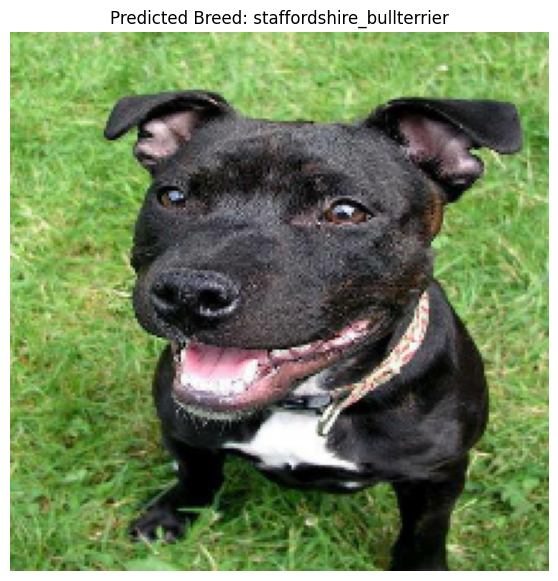

In [ ]:
index = 50
plt.figure(figsize= (7, 7))
plt.imshow(val_batch_images[index])
plt.axis("off")
plt.title(f"Predicted Breed: {get_pred_label(predictions[index])}")
print("Actual Breed:", val_batch_labels[index])

In [ ]:
def plot_pred(pred_probabs, actual_labels, images, n=0):
  predicted_label, actual_label = get_pred_label(pred_probabs[n]), actual_labels[n],
  prediction_prob, image =  np.max(pred_probabs[n]), images[n]

  # fig = plt.figure()
  plt.imshow(image)
  # fig.patch.set_facecolor("green" if predicted_label == actual_label else "red")
  plt.title(f"Predicted {predicted_label} with {prediction_prob*100:.2f}% | Actual: {actual_label}", color = "green" if predicted_label == actual_label else "red")
  plt.xticks([])
  plt.yticks([])


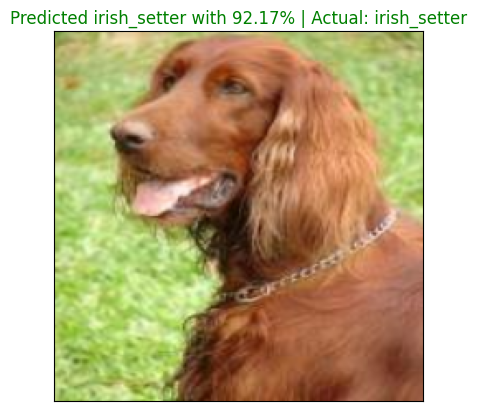

In [ ]:
plot_pred(predictions, val_batch_labels, val_batch_images, 16)

Now we will create a function to visualize top 10 predictions

This function will:

* Take as input - prediction probabilities array and ground truth array and an interger representing the index of dog image we want to check.
* Find the predictions using `get_pred_label()`
* Find the top 10:
  * Prediction Probability indexes.
  * Prediction Probability values.
  * Prediction labels.
* Plot the top 10 prediction probability values and labels, coloring the tru label as green

In [ ]:
def plot_pred_conf(prediction_prob, labels, n=1):
  pred_prob, true_label = prediction_prob[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_labels = unique_lables[pred_prob.argsort()[-10:][::-1]]
  top_10_pred_values = pred_prob[pred_prob.argsort()[-10:][::-1]]

  top_plot = plt.bar(
      top_10_pred_labels,
      top_10_pred_values,
      color="grey"
  )
  plt.xticks(rotation=90)

  if true_label in top_10_pred_labels:
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

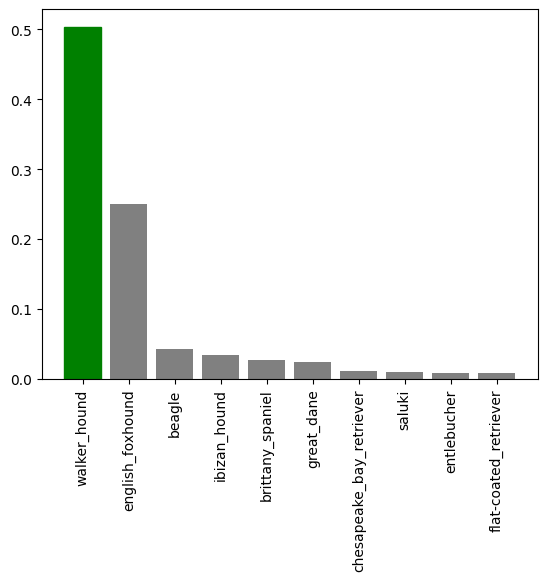

In [ ]:
plot_pred_conf(predictions, val_batch_labels, 32)

In [ ]:
predictions[16].argsort()[-10:][::-1]

array([ 56, 115,  50,  93,  32,  40,  49,  38,  89,  57])

In [ ]:
unique_lables[predictions[16].argsort()[-10:][::-1]]

array(['irish_setter', 'welsh_springer_spaniel', 'gordon_setter',
       'saluki', 'cocker_spaniel', 'english_setter', 'golden_retriever',
       'doberman', 'redbone', 'irish_terrier'], dtype=object)

In [ ]:
predictions[16][predictions[16].argsort()[-10:][::-1]]

array([0.9217437 , 0.01216237, 0.00899982, 0.00784297, 0.00596057,
       0.0044768 , 0.0039497 , 0.00343668, 0.00322404, 0.00278234],
      dtype=float32)

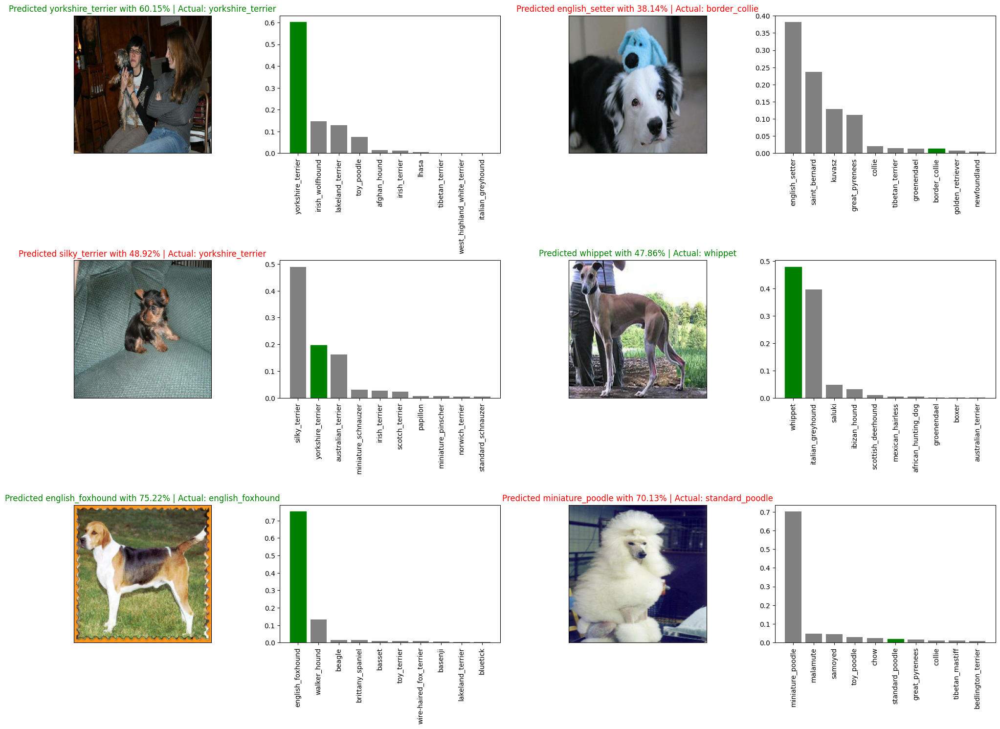

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2*i+1)
  plot_pred(predictions, val_batch_labels, val_batch_images, i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2*i+2)
  plot_pred_conf(predictions, val_batch_labels, i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

# Assuming `y_true` contains the true labels
cm = confusion_matrix(val_batch_labels, unique_lables[tf.argmax(predictions, axis=1).numpy()])
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[2 0 0 ... 0 0 0]
 [0 4 0 ... 0 0 0]
 [0 0 2 ... 0 0 0]
 ...
 [0 0 0 ... 2 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 2]]


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the confusion matrix
plt.figure(figsize=(100, 100))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=unique_lables, yticklabels=unique_lables, cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()


### Saving a loading a trained model

In [ ]:
# create a function to save our model
def save_model(model, suffix=None):
  model_dir = os.path.join(
      "drive/MyDrive/Dog Vision/models",
      datetime.datetime.now().strftime("%Y%m%d-%H%M%s")
  )
  model_path = model_dir + "-" + suffix + ".h5"
  print("Saving model to " + model_path)
  model.save(model_path)
  return model_path

In [ ]:
# create a function to load a saved model
def load_model(model_path):
  print("Loading saved model from " + model_path)
  model = tf_keras.models.load_model(
      model_path,
      custom_objects={
          "KerasLayer": hub.KerasLayer
      }
  )
  return model

In [ ]:
save_model(model, suffix="1000-image-mobilenetv2-Adam")

Saving model to drive/MyDrive/Dog Vision/models/20250114-15241736868270-1000-image-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250114-15241736868270-1000-image-mobilenetv2-Adam.h5'

In [ ]:
loaded_model = load_model('drive/MyDrive/Dog Vision/models/20250114-08501736844648-1000-image-mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/Dog Vision/models/20250114-08501736844648-1000-image-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(validation_data)

7/7 [==============================] - 1s 152ms/step - loss: 1.2863 - accuracy: 0.6700


[1.2862948179244995, 0.6700000166893005]

In [ ]:
loaded_model.evaluate(validation_data)

7/7 [==============================] - 2s 161ms/step - loss: 1.2037 - accuracy: 0.6950


[1.2036935091018677, 0.6949999928474426]

### Training The Model on Full Data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
full_data = create_data_batches(X, y)

creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building a model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf_keras.callbacks.EarlyStopping(
    monitor="accuracy",
    patience=3
)

Next Block will take a huge time for training.

In [ ]:
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early_stopping]
)

Epoch 1/100
320/320 [==============================] - 53s 150ms/step - loss: 1.3162 - accuracy: 0.6704
Epoch 2/100
320/320 [==============================] - 55s 171ms/step - loss: 0.3970 - accuracy: 0.8827
Epoch 3/100
320/320 [==============================] - 46s 143ms/step - loss: 0.2352 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1516 - accuracy: 0.9636
Epoch 5/100
320/320 [==============================] - 41s 129ms/step - loss: 0.1060 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 43s 136ms/step - loss: 0.0778 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0572 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0466 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0375 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 41s 128m

In [ ]:
save_model(full_model, suffix="full_image_set_mobilenetv2-Adam")

Saving model to drive/MyDrive/Dog Vision/models/20250114-16111736871108-full_image_set_mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250114-16111736871108-full_image_set_mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20250114-16111736871108-full_image_set_mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/Dog Vision/models/20250114-16111736871108-full_image_set_mobilenetv2-Adam.h5


### Making predictions on test data

In [ ]:
test_path = "drive/MyDrive/Dog Vision/test/"
test_data_paths = [test_path + fName for fName in os.listdir(test_path)]

In [ ]:
test_data_paths[:10]

['drive/MyDrive/Dog Vision/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/MyDrive/Dog Vision/test/e09f4ff3f7acee994812650a2fc7edef.jpg',
 'drive/MyDrive/Dog Vision/test/e2686707ac5b5f75ce2ccbc906b624d8.jpg',
 'drive/MyDrive/Dog Vision/test/e0806e5049519130d459dd7bd640a092.jpg',
 'drive/MyDrive/Dog Vision/test/e7340d1efa70bf6d6c134e1e150f9473.jpg',
 'drive/MyDrive/Dog Vision/test/dfc41d3f135d49a41e7b796883ff030e.jpg',
 'drive/MyDrive/Dog Vision/test/ddc0134def0da0472e55271da8b57c44.jpg',
 'drive/MyDrive/Dog Vision/test/e2b808864a5253fd356a9032915447a1.jpg',
 'drive/MyDrive/Dog Vision/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg',
 'drive/MyDrive/Dog Vision/test/e07106e5301fbce05cade5c94f775a72.jpg']

In [ ]:
len(test_data_paths)

10357

In [ ]:
testing_data = create_data_batches(test_data_paths, test_data=True)

creating testing data batches...


In [ ]:
testing_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(testing_data, verbose=1)

324/324 [==============================] - 278s 843ms/step


In [ ]:
np.savetxt('drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/preds_array.csv', delimiter=",")

In [ ]:
test_predictions[:2]

array([[6.68037492e-09, 4.18465013e-10, 8.49994279e-08, 4.75966003e-11,
        4.40754729e-06, 5.91999783e-09, 5.04401669e-07, 7.96731096e-04,
        5.03277033e-06, 2.46571562e-06, 1.40397333e-07, 5.15709608e-09,
        2.70123091e-10, 1.08113767e-07, 7.29302174e-09, 2.64876232e-10,
        2.11065601e-08, 4.03146821e-10, 9.40386879e-10, 1.21686263e-02,
        1.07694569e-10, 1.38563055e-05, 2.02057766e-08, 3.92724603e-11,
        4.87139005e-07, 8.11267720e-13, 2.87307733e-10, 6.43411477e-06,
        8.34402436e-10, 7.17501342e-01, 1.17400367e-09, 2.46931595e-08,
        6.60340618e-08, 2.17417337e-08, 3.00980618e-09, 1.30824162e-07,
        9.92672199e-07, 6.57059036e-06, 1.94121749e-05, 1.22624078e-09,
        1.24869518e-10, 2.17134880e-10, 3.58723740e-09, 3.46524621e-06,
        1.34958416e-11, 1.83655866e-05, 1.00422506e-08, 5.30896971e-09,
        7.24702298e-10, 9.24413546e-10, 1.39401235e-09, 2.13768736e-08,
        7.43309858e-11, 6.39333223e-07, 2.59217890e-11, 1.813110